In [1]:
!pip install -q kaggle

In [2]:
from google.colab import files
files.upload()

Saving kaggle.json to kaggle (1).json


{'kaggle.json': b'{"username":"tard232003","key":"36bb17ff05abdbaf22925a524355329a"}'}

In [3]:
!mkdir ~/.kaggle
!cp kaggle.json ~/.kaggle/

In [4]:
!chmod 600 ~/.kaggle/kaggle.json

In [5]:
!kaggle datasets list

ref                                                             title                                                size  lastUpdated          downloadCount  voteCount  usabilityRating  
--------------------------------------------------------------  --------------------------------------------------  -----  -------------------  -------------  ---------  ---------------  
meirnizri/covid19-dataset                                       COVID-19 Dataset                                      5MB  2022-11-13 15:47:17           4388        141  1.0              
akshaydattatraykhare/diabetes-dataset                           Diabetes Dataset                                      9KB  2022-10-06 08:55:25          20864        562  1.0              
thedevastator/jobs-dataset-from-glassdoor                       Salary Prediction                                     3MB  2022-11-16 13:52:31           3068         75  1.0              
fuarresvij/gdp-growth-around-the-globe                      

In [6]:
!kaggle datasets download -d vipoooool/new-plant-diseases-dataset

 99% 2.68G/2.70G [00:16<00:00, 177MB/s]
100% 2.70G/2.70G [00:17<00:00, 170MB/s]


In [7]:
! unzip new-plant-diseases-dataset

Streaming output truncated to the last 5000 lines.
  inflating: new plant diseases dataset(augmented)/New Plant Diseases Dataset(Augmented)/valid/Strawberry___healthy/273a7a9e-18be-4b6a-976a-fa5ffd69b731___RS_HL 4366_90deg.JPG  
  inflating: new plant diseases dataset(augmented)/New Plant Diseases Dataset(Augmented)/valid/Strawberry___healthy/275f8963-f4f4-4903-962b-1da716725d08___RS_HL 4780_90deg.JPG  
  inflating: new plant diseases dataset(augmented)/New Plant Diseases Dataset(Augmented)/valid/Strawberry___healthy/275f8963-f4f4-4903-962b-1da716725d08___RS_HL 4780_new30degFlipLR.JPG  
  inflating: new plant diseases dataset(augmented)/New Plant Diseases Dataset(Augmented)/valid/Strawberry___healthy/27c2aaa4-de4b-4fb1-ba8d-14d4b24b2afa___RS_HL 4665.JPG  
  inflating: new plant diseases dataset(augmented)/New Plant Diseases Dataset(Augmented)/valid/Strawberry___healthy/27c2aaa4-de4b-4fb1-ba8d-14d4b24b2afa___RS_HL 4665_270deg.JPG  
  inflating: new plant diseases dataset(augmented)/New 

In [8]:
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt

Number of images of Tomato___Late_blight: 1851 || Number of images of Peach___healthy: 1728 || Number of images of Corn_(maize)___Common_rust_: 1907 || Number of images of Cherry_(including_sour)___Powdery_mildew: 1683 || Number of images of Grape___Leaf_blight_(Isariopsis_Leaf_Spot): 1722 || Number of images of Tomato___Tomato_mosaic_virus: 1790 || Number of images of Apple___Black_rot: 1987 || Number of images of Strawberry___healthy: 1824 || Number of images of Tomato___Target_Spot: 1827 || Number of images of Tomato___healthy: 1926 || Number of images of Strawberry___Leaf_scorch: 1774 || Number of images of Raspberry___healthy: 1781 || Number of images of Tomato___Bacterial_spot: 1702 || Number of images of Tomato___Septoria_leaf_spot: 1745 || Number of images of Squash___Powdery_mildew: 1736 || Number of images of Potato___Early_blight: 1939 || Number of images of Corn_(maize)___Northern_Leaf_Blight: 1908 || Number of images of Potato___healthy: 1824 || Number of images of Grape__

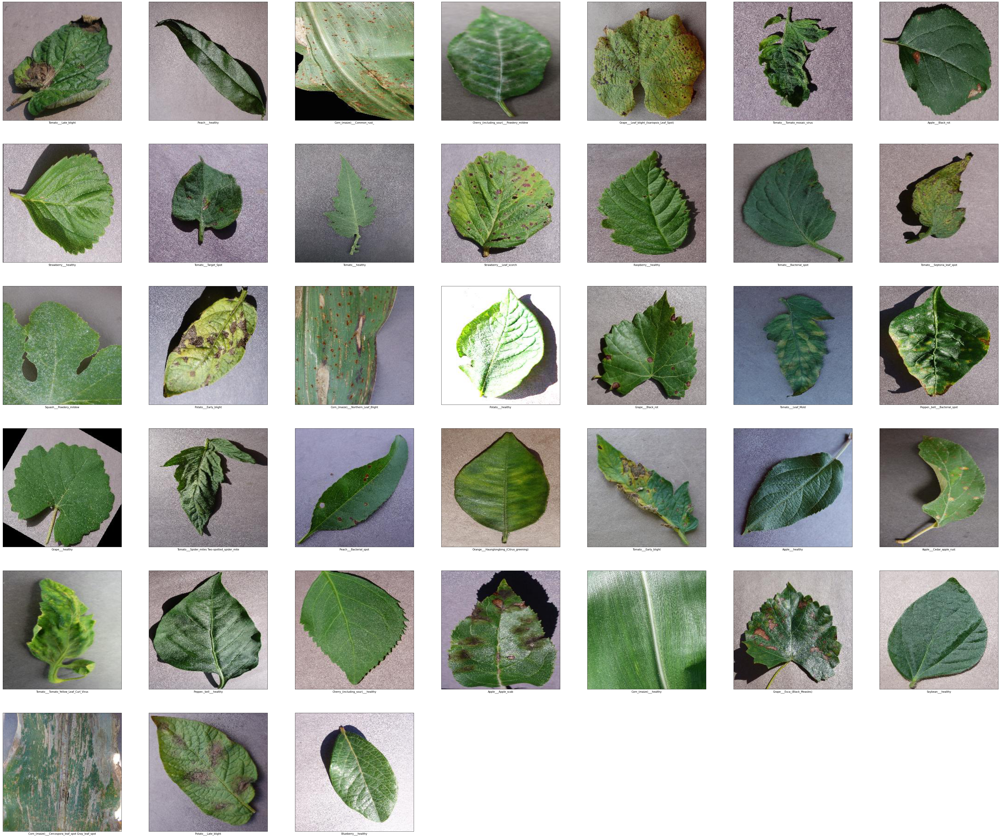

In [9]:
path='/content/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train'
plt.figure(figsize=(70,70))
count=0
plant_names=[]
total_images=0
for i in os.listdir(path):
  count+=1
  plant_names.append(i)
  plt.subplot(7,7,count)

  images_path=os.listdir(path+"/"+i)
  print("Number of images of "+i+":",len(images_path),"||",end=" ")
  total_images+=len(images_path)

  image_show=plt.imread(path+"/"+i+"/"+images_path[0])
  
  plt.imshow(image_show)
  plt.xlabel(i)
  
  plt.xticks([])
  plt.yticks([])


print("Total number of images we have",total_images)

In [10]:
print(plant_names)
print(len(plant_names))

['Tomato___Late_blight', 'Peach___healthy', 'Corn_(maize)___Common_rust_', 'Cherry_(including_sour)___Powdery_mildew', 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)', 'Tomato___Tomato_mosaic_virus', 'Apple___Black_rot', 'Strawberry___healthy', 'Tomato___Target_Spot', 'Tomato___healthy', 'Strawberry___Leaf_scorch', 'Raspberry___healthy', 'Tomato___Bacterial_spot', 'Tomato___Septoria_leaf_spot', 'Squash___Powdery_mildew', 'Potato___Early_blight', 'Corn_(maize)___Northern_Leaf_Blight', 'Potato___healthy', 'Grape___Black_rot', 'Tomato___Leaf_Mold', 'Pepper,_bell___Bacterial_spot', 'Grape___healthy', 'Tomato___Spider_mites Two-spotted_spider_mite', 'Peach___Bacterial_spot', 'Orange___Haunglongbing_(Citrus_greening)', 'Tomato___Early_blight', 'Apple___healthy', 'Apple___Cedar_apple_rust', 'Tomato___Tomato_Yellow_Leaf_Curl_Virus', 'Pepper,_bell___healthy', 'Cherry_(including_sour)___healthy', 'Apple___Apple_scab', 'Corn_(maize)___healthy', 'Grape___Esca_(Black_Measles)', 'Soybean___healthy', 'C

In [11]:
import tensorflow
from tensorflow import keras
from keras.models import Sequential,load_model,Model
from keras.layers import Conv2D,MaxPool2D,AveragePooling2D,Dense,Flatten,ZeroPadding2D,BatchNormalization,Activation,Add,Input,Dropout,GlobalAveragePooling2D
from keras.optimizers import SGD
from keras.initializers import glorot_uniform
from keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import ModelCheckpoint,EarlyStopping,ReduceLROnPlateau

In [12]:
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.applications.resnet50 import preprocess_input

In [13]:
base_model_tf=ResNet50(include_top=False,weights='imagenet',input_shape=(224,224,3),classes=38)

94765736/94765736 [==============================] - 0s 0us/step


In [14]:
base_model_tf.trainable=False

pt=Input(shape=(224,224,3))
func=tensorflow.cast(pt,tensorflow.float32)
x=preprocess_input(func) #This function used to zero-center each color channel wrt Imagenet dataset
model_resnet=base_model_tf(x,training=False)
model_resnet=GlobalAveragePooling2D()(model_resnet)
model_resnet=Dense(128,activation='relu')(model_resnet)
model_resnet=Dense(64,activation='relu')(model_resnet)
model_resnet=Dense(38,activation='softmax')(model_resnet)


model_main=Model(inputs=pt,outputs=model_resnet)
model_main.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 tf.cast (TFOpLambda)        (None, 224, 224, 3)       0         
                                                                 
 tf.__operators__.getitem (S  (None, 224, 224, 3)      0         
 licingOpLambda)                                                 
                                                                 
 tf.nn.bias_add (TFOpLambda)  (None, 224, 224, 3)      0         
                                                                 
 resnet50 (Functional)       (None, 7, 7, 2048)        23587712  
                                                                 
 global_average_pooling2d (G  (None, 2048)             0         
 lobalAveragePooling2D)                                      

In [15]:
path_train='/content/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train'

In [16]:
train_datagen= ImageDataGenerator(shear_range=0.2,zoom_range=0.2,horizontal_flip=False,vertical_flip=False
                                  ,fill_mode='nearest',width_shift_range=0.2,height_shift_range=0.2,validation_split=0.05)

batch_size=32
train= train_datagen.flow_from_directory(directory=path_train,batch_size=32,target_size=(224,224),
                                         color_mode='rgb',class_mode='categorical',seed=42,subset='training')

test= train_datagen.flow_from_directory(
    path,
    target_size=(224,224),
    subset='validation') 

Found 66795 images belonging to 38 classes.
Found 3500 images belonging to 38 classes.


In [17]:
val_datagen=ImageDataGenerator()
path_valid='/content/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/valid'


valid=val_datagen.flow_from_directory(directory=path_valid,batch_size=32,target_size=(224,224),color_mode='rgb',class_mode='categorical')

Found 17572 images belonging to 38 classes.


In [18]:
es=EarlyStopping(monitor='val_accuracy',verbose=1,patience=7,mode='auto')
mc=ModelCheckpoint(filepath='/content',monitor='val_accuracy',verbose=1,save_best_only=True)
lr=ReduceLROnPlateau(monitor='val_accuracy',verbose=1,patience=5,min_lr=0.001)

In [19]:
model_main.compile(optimizer='Adam',loss='categorical_crossentropy',metrics=['accuracy'])

In [20]:
model_main.fit(train,validation_data=valid,epochs=30,steps_per_epoch=200,verbose=1,callbacks=[mc,es,lr])

Epoch 1/30
200/200 [==============================] - ETA: 0s - loss: 1.3890 - accuracy: 0.6275
Epoch 1: val_accuracy improved from -inf to 0.84561, saving model to /content


200/200 [==============================] - 168s 789ms/step - loss: 1.3890 - accuracy: 0.6275 - val_loss: 0.5231 - val_accuracy: 0.8456 - lr: 0.0010
Epoch 2/30
200/200 [==============================] - ETA: 0s - loss: 0.4253 - accuracy: 0.8678
Epoch 2: val_accuracy improved from 0.84561 to 0.90821, saving model to /content


200/200 [==============================] - 157s 785ms/step - loss: 0.4253 - accuracy: 0.8678 - val_loss: 0.3011 - val_accuracy: 0.9082 - lr: 0.0010
Epoch 3/30
200/200 [==============================] - ETA: 0s - loss: 0.3005 - accuracy: 0.9055
Epoch 3: val_accuracy did not improve from 0.90821
200/200 [==============================] - 138s 692ms/step - loss: 0.3005 - accuracy: 0.9055 - val_loss: 0.3221 - val_accuracy: 0.8957 - lr: 0.0010
Epoch 4/30
200/200 [==============================] - ETA: 0s - loss: 0.2662 - accuracy: 0.9144
Epoch 4: val_accuracy improved from 0.90821 to 0.92078, saving model to /content


200/200 [==============================] - 157s 784ms/step - loss: 0.2662 - accuracy: 0.9144 - val_loss: 0.2421 - val_accuracy: 0.9208 - lr: 0.0010
Epoch 5/30
200/200 [==============================] - ETA: 0s - loss: 0.2149 - accuracy: 0.9294
Epoch 5: val_accuracy improved from 0.92078 to 0.94042, saving model to /content


200/200 [==============================] - 156s 783ms/step - loss: 0.2149 - accuracy: 0.9294 - val_loss: 0.1798 - val_accuracy: 0.9404 - lr: 0.0010
Epoch 6/30
200/200 [==============================] - ETA: 0s - loss: 0.2224 - accuracy: 0.9305
Epoch 6: val_accuracy did not improve from 0.94042
200/200 [==============================] - 135s 674ms/step - loss: 0.2224 - accuracy: 0.9305 - val_loss: 0.2184 - val_accuracy: 0.9291 - lr: 0.0010
Epoch 7/30
200/200 [==============================] - ETA: 0s - loss: 0.2090 - accuracy: 0.9366
Epoch 7: val_accuracy improved from 0.94042 to 0.94377, saving model to /content


200/200 [==============================] - 154s 774ms/step - loss: 0.2090 - accuracy: 0.9366 - val_loss: 0.1696 - val_accuracy: 0.9438 - lr: 0.0010
Epoch 8/30
200/200 [==============================] - ETA: 0s - loss: 0.1812 - accuracy: 0.9388
Epoch 8: val_accuracy did not improve from 0.94377
200/200 [==============================] - 135s 674ms/step - loss: 0.1812 - accuracy: 0.9388 - val_loss: 0.1978 - val_accuracy: 0.9348 - lr: 0.0010
Epoch 9/30
200/200 [==============================] - ETA: 0s - loss: 0.1801 - accuracy: 0.9423
Epoch 9: val_accuracy did not improve from 0.94377
200/200 [==============================] - 133s 668ms/step - loss: 0.1801 - accuracy: 0.9423 - val_loss: 0.1997 - val_accuracy: 0.9340 - lr: 0.0010
Epoch 10/30
200/200 [==============================] - ETA: 0s - loss: 0.1710 - accuracy: 0.9420
Epoch 10: val_accuracy did not improve from 0.94377
200/200 [==============================] - 133s 667ms/step - loss: 0.1710 - accuracy: 0.9420 - val_loss: 0.1713 -

200/200 [==============================] - 153s 769ms/step - loss: 0.1340 - accuracy: 0.9566 - val_loss: 0.1361 - val_accuracy: 0.9541 - lr: 0.0010
Epoch 13/30
200/200 [==============================] - ETA: 0s - loss: 0.1490 - accuracy: 0.9500
Epoch 13: val_accuracy did not improve from 0.95407
200/200 [==============================] - 134s 670ms/step - loss: 0.1490 - accuracy: 0.9500 - val_loss: 0.1420 - val_accuracy: 0.9521 - lr: 0.0010
Epoch 14/30
200/200 [==============================] - ETA: 0s - loss: 0.1644 - accuracy: 0.9481
Epoch 14: val_accuracy did not improve from 0.95407
200/200 [==============================] - 133s 668ms/step - loss: 0.1644 - accuracy: 0.9481 - val_loss: 0.1556 - val_accuracy: 0.9485 - lr: 0.0010
Epoch 15/30
200/200 [==============================] - ETA: 0s - loss: 0.1469 - accuracy: 0.9516
Epoch 15: val_accuracy improved from 0.95407 to 0.95641, saving model to /content


200/200 [==============================] - 152s 764ms/step - loss: 0.1469 - accuracy: 0.9516 - val_loss: 0.1320 - val_accuracy: 0.9564 - lr: 0.0010
Epoch 16/30
200/200 [==============================] - ETA: 0s - loss: 0.1488 - accuracy: 0.9520
Epoch 16: val_accuracy did not improve from 0.95641
200/200 [==============================] - 133s 664ms/step - loss: 0.1488 - accuracy: 0.9520 - val_loss: 0.1722 - val_accuracy: 0.9415 - lr: 0.0010
Epoch 17/30
200/200 [==============================] - ETA: 0s - loss: 0.1295 - accuracy: 0.9569
Epoch 17: val_accuracy improved from 0.95641 to 0.96193, saving model to /content


200/200 [==============================] - 152s 760ms/step - loss: 0.1295 - accuracy: 0.9569 - val_loss: 0.1124 - val_accuracy: 0.9619 - lr: 0.0010
Epoch 18/30
200/200 [==============================] - ETA: 0s - loss: 0.1270 - accuracy: 0.9581
Epoch 18: val_accuracy did not improve from 0.96193
200/200 [==============================] - 132s 663ms/step - loss: 0.1270 - accuracy: 0.9581 - val_loss: 0.1212 - val_accuracy: 0.9590 - lr: 0.0010
Epoch 19/30
200/200 [==============================] - ETA: 0s - loss: 0.1358 - accuracy: 0.9566
Epoch 19: val_accuracy did not improve from 0.96193
200/200 [==============================] - 134s 669ms/step - loss: 0.1358 - accuracy: 0.9566 - val_loss: 0.2431 - val_accuracy: 0.9279 - lr: 0.0010
Epoch 20/30
200/200 [==============================] - ETA: 0s - loss: 0.1340 - accuracy: 0.9533
Epoch 20: val_accuracy did not improve from 0.96193
200/200 [==============================] - 133s 667ms/step - loss: 0.1340 - accuracy: 0.9533 - val_loss: 0.12

In [21]:
model_main.save("rescolab1.h5")

In [22]:
import matplotlib.pyplot as plt
%matplotlib inline
import cv2
from PIL import Image

Text(0.5, 1.0, 'loss')

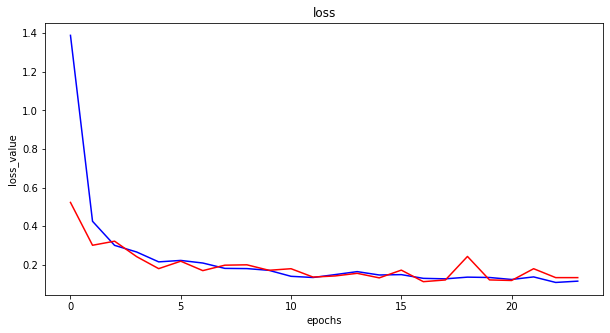

In [23]:
plt.figure(figsize=(10,5))
plt.plot(model_main.history.history['loss'],color='b',label='Training loss')
plt.plot(model_main.history.history['val_loss'],color='r',label='Validation loss')
plt.xlabel("epochs")
plt.ylabel("loss_value")
plt.title("loss")

Text(0.5, 1.0, 'accuracy graph')

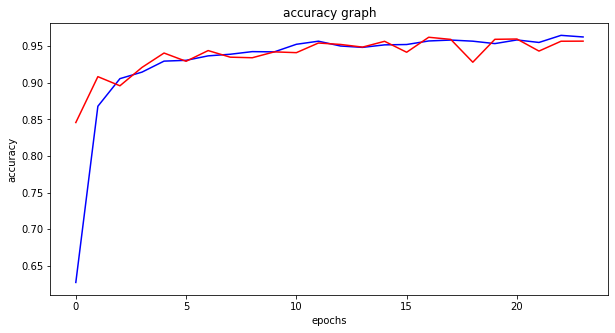

In [24]:
plt.figure(figsize=(10,5))
plt.plot(model_main.history.history['accuracy'],color='b',label='Training accuracy')
plt.plot(model_main.history.history['val_accuracy'],color='r',label='Validation accsuracy')
plt.xlabel("epochs")
plt.ylabel("accuracy")
plt.title("accuracy graph")

In [25]:
model_main.evaluate(valid)

550/550 [==============================] - 61s 110ms/step - loss: 0.1333 - accuracy: 0.9566


[0.133309468626976, 0.9566355347633362]

In [26]:
model_main.evaluate(test)

110/110 [==============================] - 43s 388ms/step - loss: 0.1513 - accuracy: 0.9540


[0.15134510397911072, 0.9539999961853027]

In [40]:
q=plant_names.sort()

In [41]:
print(plant_names)

['Apple___Apple_scab', 'Apple___Black_rot', 'Apple___Cedar_apple_rust', 'Apple___healthy', 'Blueberry___healthy', 'Cherry_(including_sour)___Powdery_mildew', 'Cherry_(including_sour)___healthy', 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot', 'Corn_(maize)___Common_rust_', 'Corn_(maize)___Northern_Leaf_Blight', 'Corn_(maize)___healthy', 'Grape___Black_rot', 'Grape___Esca_(Black_Measles)', 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)', 'Grape___healthy', 'Orange___Haunglongbing_(Citrus_greening)', 'Peach___Bacterial_spot', 'Peach___healthy', 'Pepper,_bell___Bacterial_spot', 'Pepper,_bell___healthy', 'Potato___Early_blight', 'Potato___Late_blight', 'Potato___healthy', 'Raspberry___healthy', 'Soybean___healthy', 'Squash___Powdery_mildew', 'Strawberry___Leaf_scorch', 'Strawberry___healthy', 'Tomato___Bacterial_spot', 'Tomato___Early_blight', 'Tomato___Late_blight', 'Tomato___Leaf_Mold', 'Tomato___Septoria_leaf_spot', 'Tomato___Spider_mites Two-spotted_spider_mite', 'Tomato___Target_Sp

In [42]:
classes=plant_names

1/1 [==============================] - 1s 807ms/step
[[2.45698857e-07 9.94376779e-01 6.08595272e-08 1.60427851e-06
  2.32285813e-09 2.50984483e-10 1.60762051e-04 4.06299741e-08
  4.81132044e-11 4.05388300e-06 6.78182423e-12 1.74706685e-08
  2.32801316e-08 9.82233139e-09 1.00160901e-06 5.12372471e-11
  2.64300439e-07 3.79882237e-11 1.44057504e-08 1.26105223e-10
  3.85220886e-08 1.71395200e-08 1.21576749e-09 1.17457075e-08
  1.33462054e-05 7.30493221e-10 1.21820741e-03 9.53423722e-08
  6.12311633e-05 5.02413513e-07 6.56020731e-08 8.10342002e-11
  4.05069720e-03 4.32126370e-07 9.77725867e-05 2.08687711e-12
  1.51261920e-10 1.25605056e-05]]
Apple___Black_rot


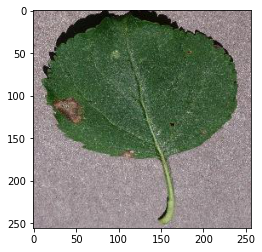

In [43]:
# classes=list(train.class_indices.keys())
# print(classes)
# print(plant_names)
# model=tf.keras.models.load_model('v4.h5')
import numpy as np
import matplotlib.pyplot as plt
# Pre-Processing test data same as train data.
img_width=224
img_height=224
model_main.compile(optimizer='adam',loss='categorical_crossentropy',metrics=['accuracy'])
from keras.preprocessing import image
def prepare(img_path):
    img = tensorflow.keras.utils.load_img(img_path, target_size=(224,224))
    x = tensorflow.keras.utils.img_to_array(img)
    return np.expand_dims(x, axis=0)
    
    
result = model_main.predict([prepare('/content/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train/Apple___Black_rot/00e909aa-e3ae-4558-9961-336bb0f35db3___JR_FrgE.S 8593.JPG')])

disease=tensorflow.keras.utils.load_img('/content/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train/Apple___Black_rot/00e909aa-e3ae-4558-9961-336bb0f35db3___JR_FrgE.S 8593.JPG')
# print(classes[n])
plt.imshow(disease)
print(result)
import numpy as np
classresult=np.argmax(result,axis=1)
print(classes[classresult[0]])